# Palaskas Georgios 
# Machine Learning 
# Project 1/Classification

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

# Data insertion

In [2]:
#load breast cancer dataset
from sklearn.datasets import load_breast_cancer
breast_cancer = load_breast_cancer()
#create dataframe
df = pd.DataFrame(data = breast_cancer.data, columns = breast_cancer.feature_names)
df['target'] = breast_cancer.target
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [3]:
df.tail()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0
568,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,0.05884,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

# A peek at the Data

In [5]:
# Print the dimensions of the DataFrame
print("DataFrame dimensions:")
print(df.shape)

DataFrame dimensions:
(569, 31)


In [6]:
# data type of each attribute 
df.dtypes

mean radius                float64
mean texture               float64
mean perimeter             float64
mean area                  float64
mean smoothness            float64
mean compactness           float64
mean concavity             float64
mean concave points        float64
mean symmetry              float64
mean fractal dimension     float64
radius error               float64
texture error              float64
perimeter error            float64
area error                 float64
smoothness error           float64
compactness error          float64
concavity error            float64
concave points error       float64
symmetry error             float64
fractal dimension error    float64
worst radius               float64
worst texture              float64
worst perimeter            float64
worst area                 float64
worst smoothness           float64
worst compactness          float64
worst concavity            float64
worst concave points       float64
worst symmetry      

# Statistical summary

In [7]:
pd.set_option('display.precision', 4 )
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.0000,569.0000,569.000,569.0000,569.0000,569.0000,569.0000,569.0000,569.0000,569.0000,...,569.0000,569.0000,569.0000,569.0000,569.0000,569.0000,569.0000,569.0000,569.0000,569.0000
mean,14.1273,19.2896,91.969,654.8891,0.0964,0.1043,0.0888,0.0489,0.1812,0.0628,...,25.6772,107.2612,880.5831,0.1324,0.2543,0.2722,0.1146,0.2901,0.0839,0.6274
std,3.5240,4.3010,24.299,351.9141,0.0141,0.0528,0.0797,0.0388,0.0274,0.0071,...,6.1463,33.6025,569.3570,0.0228,0.1573,0.2086,0.0657,0.0619,0.0181,0.4839
min,6.9810,9.7100,43.790,143.5000,0.0526,0.0194,0.0000,0.0000,0.1060,0.0500,...,12.0200,50.4100,185.2000,0.0712,0.0273,0.0000,0.0000,0.1565,0.0550,0.0000
25%,11.7000,16.1700,75.170,420.3000,0.0864,0.0649,0.0296,0.0203,0.1619,0.0577,...,21.0800,84.1100,515.3000,0.1166,0.1472,0.1145,0.0649,0.2504,0.0715,0.0000
50%,13.3700,18.8400,86.240,551.1000,0.0959,0.0926,0.0615,0.0335,0.1792,0.0615,...,25.4100,97.6600,686.5000,0.1313,0.2119,0.2267,0.0999,0.2822,0.0800,1.0000
75%,15.7800,21.8000,104.100,782.7000,0.1053,0.1304,0.1307,0.0740,0.1957,0.0661,...,29.7200,125.4000,1084.0000,0.1460,0.3391,0.3829,0.1614,0.3179,0.0921,1.0000
max,28.1100,39.2800,188.500,2501.0000,0.1634,0.3454,0.4268,0.2012,0.3040,0.0974,...,49.5400,251.2000,4254.0000,0.2226,1.0580,1.2520,0.2910,0.6638,0.2075,1.0000


# Data correlation

In [8]:
df.corr(method='pearson')

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
mean radius,1.0000,0.3238,0.9979,0.9874,0.1706,0.5061,0.6768,0.8225,0.1477,-0.3116,...,0.2970,0.9651,0.9411,0.1196,0.4135,0.5269,0.7442,0.1640,0.0071,-0.7300
mean texture,0.3238,1.0000,0.3295,0.3211,-0.0234,0.2367,0.3024,0.2935,0.0714,-0.0764,...,0.9120,0.3580,0.3435,0.0775,0.2778,0.3010,0.2953,0.1050,0.1192,-0.4152
mean perimeter,0.9979,0.3295,1.0000,0.9865,0.2073,0.5569,0.7161,0.8510,0.1830,-0.2615,...,0.3030,0.9704,0.9415,0.1505,0.4558,0.5639,0.7712,0.1891,0.0510,-0.7426
mean area,0.9874,0.3211,0.9865,1.0000,0.1770,0.4985,0.6860,0.8233,0.1513,-0.2831,...,0.2875,0.9591,0.9592,0.1235,0.3904,0.5126,0.7220,0.1436,0.0037,-0.7090
mean smoothness,0.1706,-0.0234,0.2073,0.1770,1.0000,0.6591,0.5220,0.5537,0.5578,0.5848,...,0.0361,0.2389,0.2067,0.8053,0.4725,0.4349,0.5031,0.3943,0.4993,-0.3586
mean compactness,0.5061,0.2367,0.5569,0.4985,0.6591,1.0000,0.8831,0.8311,0.6026,0.5654,...,0.2481,0.5902,0.5096,0.5655,0.8658,0.8163,0.8156,0.5102,0.6874,-0.5965
mean concavity,0.6768,0.3024,0.7161,0.6860,0.5220,0.8831,1.0000,0.9214,0.5007,0.3368,...,0.2999,0.7296,0.6760,0.4488,0.7550,0.8841,0.8613,0.4095,0.5149,-0.6964
mean concave points,0.8225,0.2935,0.8510,0.8233,0.5537,0.8311,0.9214,1.0000,0.4625,0.1669,...,0.2928,0.8559,0.8096,0.4528,0.6675,0.7524,0.9102,0.3757,0.3687,-0.7766
mean symmetry,0.1477,0.0714,0.1830,0.1513,0.5578,0.6026,0.5007,0.4625,1.0000,0.4799,...,0.0907,0.2192,0.1772,0.4267,0.4732,0.4337,0.4303,0.6998,0.4384,-0.3305
mean fractal dimension,-0.3116,-0.0764,-0.2615,-0.2831,0.5848,0.5654,0.3368,0.1669,0.4799,1.0000,...,-0.0513,-0.2052,-0.2319,0.5049,0.4588,0.3462,0.1753,0.3340,0.7673,0.0128


So we can see that there are enough big positive correlations between the attributes 

# Correlation matrix

<Axes: >

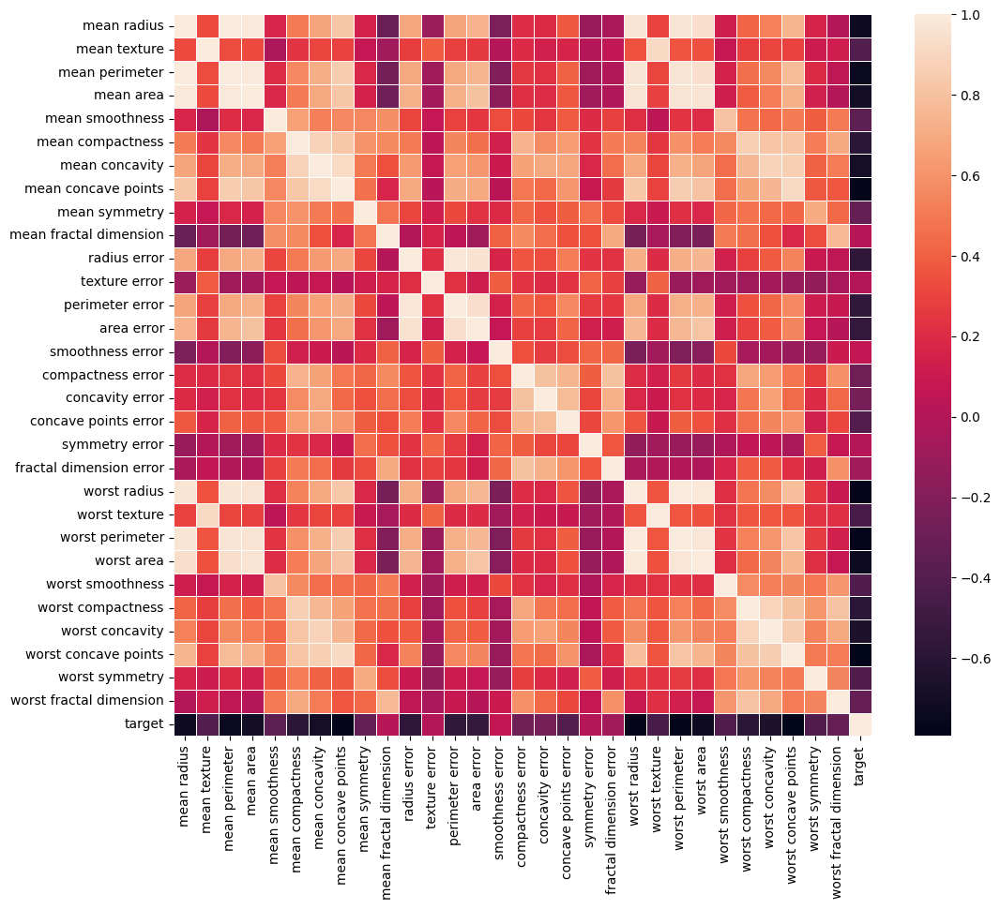

In [9]:
correlations = df.corr()
# plot correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlations, linewidths=0.5)

# Skew of Univariate Distributions

In [10]:
df.skew()

mean radius                0.9424
mean texture               0.6504
mean perimeter             0.9907
mean area                  1.6457
mean smoothness            0.4563
mean compactness           1.1901
mean concavity             1.4012
mean concave points        1.1712
mean symmetry              0.7256
mean fractal dimension     1.3045
radius error               3.0886
texture error              1.6464
perimeter error            3.4436
area error                 5.4472
smoothness error           2.3145
compactness error          1.9022
concavity error            5.1105
concave points error       1.4447
symmetry error             2.1951
fractal dimension error    3.9240
worst radius               1.1031
worst texture              0.4983
worst perimeter            1.1282
worst area                 1.8594
worst smoothness           0.4154
worst compactness          1.4736
worst concavity            1.1502
worst concave points       0.4926
worst symmetry             1.4339
worst fractal 

display the class distribution

In [11]:
df.groupby('target').size()

target
0    212
1    357
dtype: int64

# Histogram of each attribute

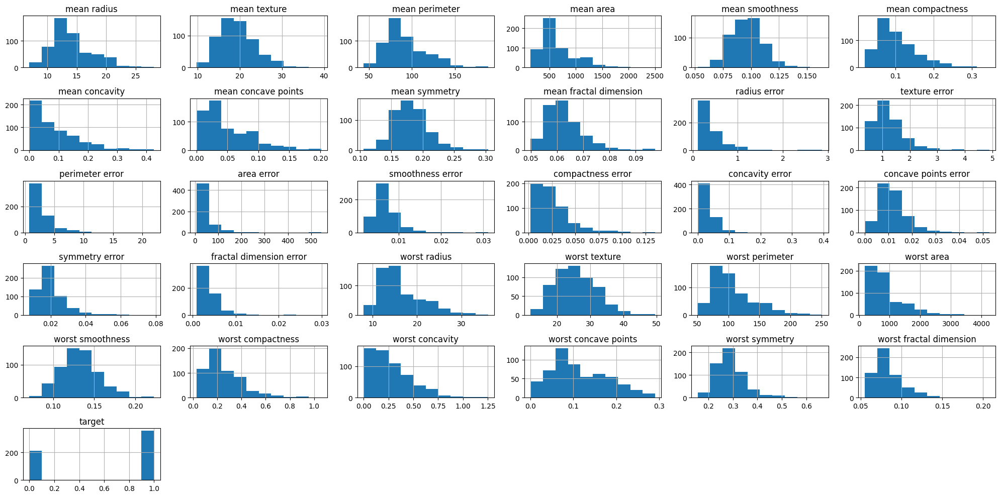

In [12]:
h = df.hist( figsize=(20, 10))
plt.tight_layout()
plt.show()

# Density plots

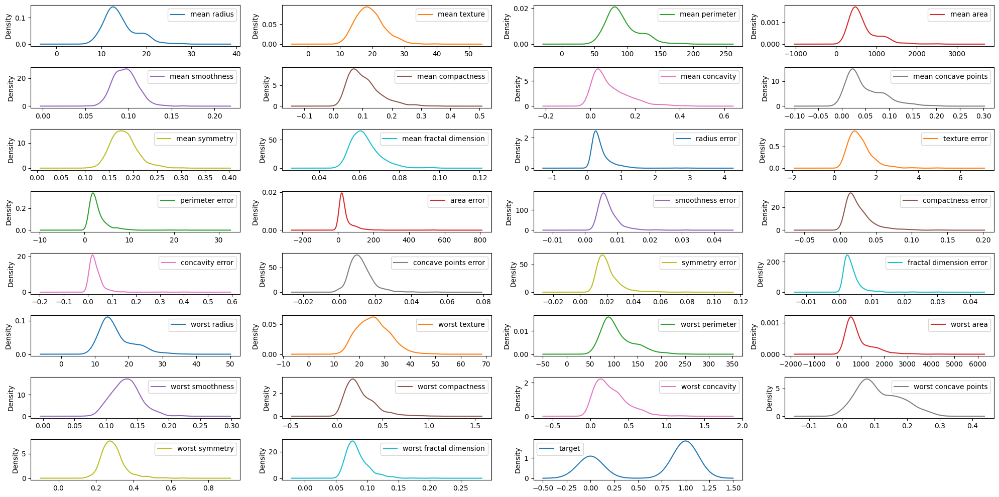

In [13]:
df.plot(kind='density', subplots=True, layout=(8,4), sharex=False, figsize=(20, 10))
plt.tight_layout()
plt.show()

# Box plots

<Axes: >

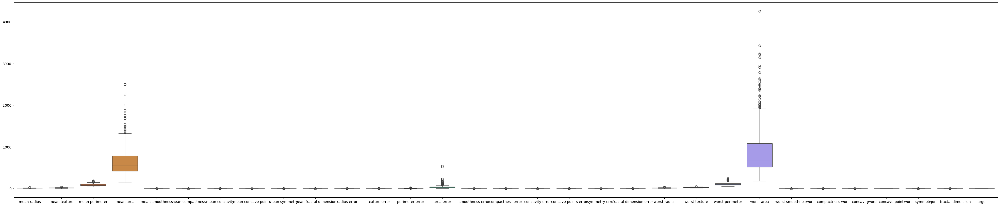

In [14]:
f = plt.figure(figsize=(50,10))
plt.tight_layout()
sns.boxplot(data=df)

split it into two different figures for better understanding (mean area and worst area values are not included)

<Axes: >

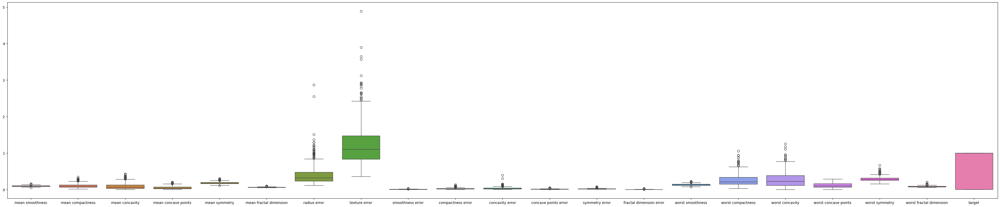

In [15]:
stats1_df = df.drop(['mean area', 'worst area', 'area error', 'mean radius', 'mean texture', 'mean perimeter', 'worst perimeter', 'worst texture', 'worst radius', 'perimeter error'], axis=1)
plt.figure(figsize=(50,10))
sns.boxplot(data=stats1_df)

<Axes: >

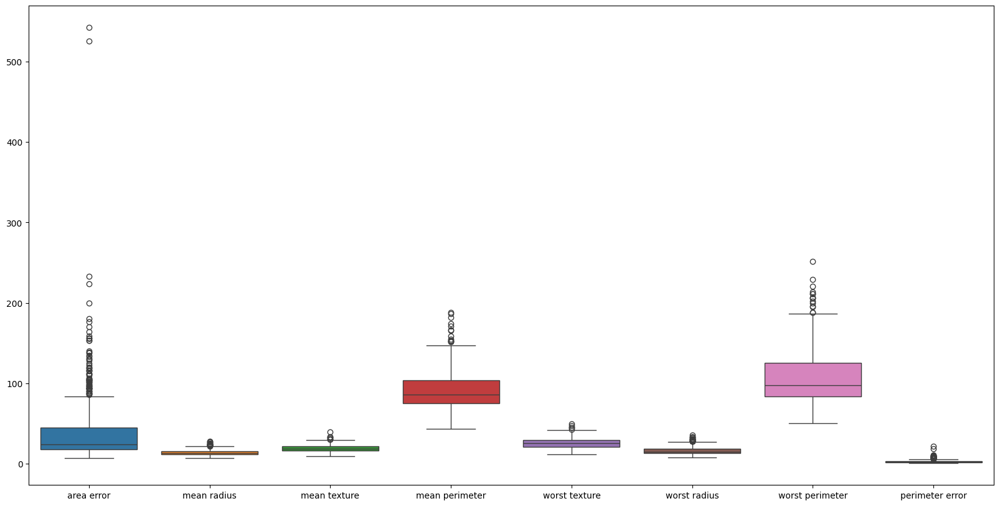

In [16]:
stats2_df = df[['area error', 'mean radius', 'mean texture', 'mean perimeter','worst texture', 'worst radius', 'worst perimeter', 'perimeter error']]
plt.figure(figsize=(20,10))
sns.boxplot(data=stats2_df)

# Scatter plots

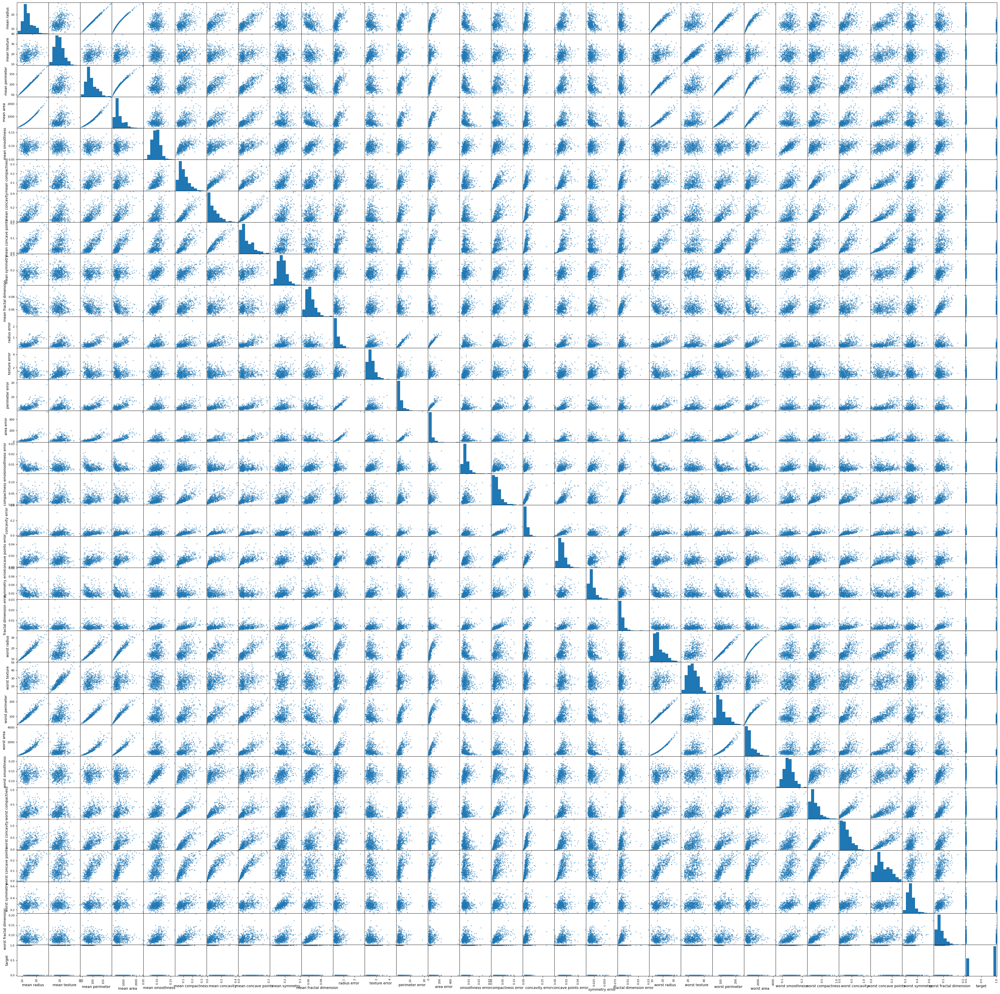

In [17]:
from pandas.plotting import scatter_matrix
scatter_matrix(df, figsize=(50, 50))
plt.show()

# Classification 
We are using a set of classification algorithms:
- Logistic Regression
- KNN
- Decision tree
- SVM
- XGBoost
- Adaboost
- RandomForest
- Voting
- Naive Bayes

And the we are using accuracy and some other metrics(precision, recall, f1, confusion_matrix) to evaluate them and fianlly to choose the winning one.


In [18]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
array = df.values
X = array[:,0:30]
Y = array[:,30]
kfold = KFold(n_splits=10, random_state=7, shuffle=True)
test_size = 0.2
seed = 7
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)
#normalize data
scaler1 = MinMaxScaler(feature_range=(0, 1))
normalized_X_train = scaler1.fit_transform(X_train)
normalized_X_test = scaler1.transform(X_test)
#standardize data
scaler2 = StandardScaler().fit(X_train)
standardized_X_train = scaler2.transform(X_train)
standardized_X_test = scaler2.transform(X_test)

# Logistic Regression classifier

In [19]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(solver='liblinear')
model.fit(standardized_X_train, Y_train)

results = cross_val_score(LogisticRegression(solver='liblinear'), standardized_X_train, Y_train, cv=kfold)
print(f'The estimated accuracy is: {results.mean()}')

predicted = model.predict(standardized_X_test)
matrix = confusion_matrix(Y_test, predicted)
print(f'Confusion matrix:\n {matrix}')

precision= precision_score(Y_test, predicted)
print('Precision score: {0:0.2f}'.format(precision))

recall = recall_score(Y_test, predicted)
print('Recall score: {0:0.2f}'.format(recall))

f1 = f1_score(Y_test, predicted)
print('F1 score: {0:0.2f}'.format(f1))



The estimated accuracy is: 0.9690821256038648
Confusion matrix:
 [[38  2]
 [ 0 74]]
Precision score: 0.97
Recall score: 1.00
F1 score: 0.99


# KNN classifier

In [20]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier()
model.fit(normalized_X_train, Y_train)

results = cross_val_score(KNeighborsClassifier(), normalized_X_train, Y_train, cv=kfold)
print(f'The estimated accuracy is: {results.mean()}')

predicted = model.predict(normalized_X_test)
matrix = confusion_matrix(Y_test, predicted)
print(f'Confusion matrix:\n {matrix}')

precision= precision_score(Y_test, predicted)
print('Precision score: {0:0.2f}'.format(precision))

recall = recall_score(Y_test, predicted)
print('Recall score: {0:0.2f}'.format(recall))

f1 = f1_score(Y_test, predicted)
print('F1 score: {0:0.2f}'.format(f1))

The estimated accuracy is: 0.9690821256038648
Confusion matrix:
 [[36  4]
 [ 0 74]]
Precision score: 0.95
Recall score: 1.00
F1 score: 0.97


# Decision tree classifier 

In [21]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(max_depth=2)
model.fit(standardized_X_train, Y_train)

results = cross_val_score(DecisionTreeClassifier(max_depth=2), standardized_X_train, Y_train, cv=kfold)
print(f'The estimated accuracy is: {results.mean()}')

predicted = model.predict(standardized_X_test)
matrix = confusion_matrix(Y_test, predicted)
print(f'Confusion matrix:\n {matrix}')

precision= precision_score(Y_test, predicted)
print('Precision score: {0:0.2f}'.format(precision))

recall = recall_score(Y_test, predicted)
print('Recall score: {0:0.2f}'.format(recall))

f1 = f1_score(Y_test, predicted)
print('F1 score: {0:0.2f}'.format(f1))

The estimated accuracy is: 0.9293719806763285
Confusion matrix:
 [[32  8]
 [ 1 73]]
Precision score: 0.90
Recall score: 0.99
F1 score: 0.94


# SVM classiifier

In [22]:
from sklearn.svm import SVC
kernel='rbf'
C=10
gamma='auto'
model = SVC(kernel=kernel, C=C,gamma=gamma)
model.fit(standardized_X_train, Y_train)

results = cross_val_score(SVC(kernel=kernel, C=C,gamma=gamma), standardized_X_train, Y_train, cv=kfold)
print(f'The estimated accuracy is: {results.mean()}')

predicted = model.predict(standardized_X_test)
matrix = confusion_matrix(Y_test, predicted)
print(f'Confusion matrix:\n {matrix}')

precision= precision_score(Y_test, predicted)
print('Precision score: {0:0.2f}'.format(precision))

recall = recall_score(Y_test, predicted)
print('Recall score: {0:0.2f}'.format(recall))

f1 = f1_score(Y_test, predicted)
print('F1 score: {0:0.2f}'.format(f1))

The estimated accuracy is: 0.9669565217391305
Confusion matrix:
 [[38  2]
 [ 1 73]]
Precision score: 0.97
Recall score: 0.99
F1 score: 0.98


# XGBoost classifier

In [23]:
from xgboost import XGBClassifier

model = XGBClassifier(use_label_encoder=False, eval_metric='error')
model.fit(standardized_X_train, Y_train)

results = cross_val_score(XGBClassifier(use_label_encoder=False, eval_metric='error'), standardized_X_train, Y_train, cv=kfold)
print(f'The estimated accuracy is: {results.mean()}')

predicted = model.predict(standardized_X_test)
matrix = confusion_matrix(Y_test, predicted)
print(f'Confusion matrix:\n {matrix}')

precision= precision_score(Y_test, predicted)
print('Precision score: {0:0.2f}'.format(precision))

recall = recall_score(Y_test, predicted)
print('Recall score: {0:0.2f}'.format(recall))

f1 = f1_score(Y_test, predicted)
print('F1 score: {0:0.2f}'.format(f1))

The estimated accuracy is: 0.9602898550724637
Confusion matrix:
 [[38  2]
 [ 0 74]]
Precision score: 0.97
Recall score: 1.00
F1 score: 0.99


# Adaboost classifier

In [24]:
from sklearn.ensemble import AdaBoostClassifier
num_trees = 30
model = AdaBoostClassifier(n_estimators=num_trees, random_state=seed)
model.fit(standardized_X_train, Y_train)

results = cross_val_score(AdaBoostClassifier(n_estimators=num_trees, random_state=seed), standardized_X_train, Y_train, cv=kfold)
print(f'The estimated accuracy is: {results.mean()}')

predicted = model.predict(standardized_X_test)
matrix = confusion_matrix(Y_test, predicted)
print(f'Confusion matrix:\n {matrix}')

precision= precision_score(Y_test, predicted)
print('Precision score: {0:0.2f}'.format(precision))

recall = recall_score(Y_test, predicted)
print('Recall score: {0:0.2f}'.format(recall))

f1 = f1_score(Y_test, predicted)
print('F1 score: {0:0.2f}'.format(f1))

The estimated accuracy is: 0.953671497584541
Confusion matrix:
 [[38  2]
 [ 0 74]]
Precision score: 0.97
Recall score: 1.00
F1 score: 0.99


# RandomForest Classifier

In [25]:
from sklearn.ensemble import RandomForestClassifier
num_trees = 100
max_features = 3
model = RandomForestClassifier(n_estimators=num_trees, max_features=max_features)
model.fit(standardized_X_train, Y_train)

results = cross_val_score(RandomForestClassifier(n_estimators=num_trees, max_features=max_features), standardized_X_train, Y_train, cv=kfold)
print(f'The estimated accuracy is: {results.mean()}')

predicted = model.predict(standardized_X_test)
matrix = confusion_matrix(Y_test, predicted)
print(f'Confusion matrix:\n {matrix}')

precision= precision_score(Y_test, predicted)
print('Precision score: {0:0.2f}'.format(precision))

recall = recall_score(Y_test, predicted)
print('Recall score: {0:0.2f}'.format(recall))

f1 = f1_score(Y_test, predicted)
print('F1 score: {0:0.2f}'.format(f1))

The estimated accuracy is: 0.9579710144927536
Confusion matrix:
 [[37  3]
 [ 0 74]]
Precision score: 0.96
Recall score: 1.00
F1 score: 0.98


# Voting classifier

In [26]:
from sklearn.ensemble import VotingClassifier
estimators = []
model1 = LogisticRegression(solver='liblinear')
estimators.append(('logistic', model1))
model2 = DecisionTreeClassifier()
estimators.append(('cart', model2))
model3 = SVC(gamma='scale')
estimators.append(('svm', model3))
ensemble = VotingClassifier(estimators)
model = ensemble
model.fit(normalized_X_train, Y_train)

results = cross_val_score(ensemble, normalized_X_train, Y_train, cv=kfold)
print(f'The estimated accuracy is: {results.mean()}')

predicted = model.predict(normalized_X_test)
matrix = confusion_matrix(Y_test, predicted)
print(f'Confusion matrix:\n {matrix}')

precision= precision_score(Y_test, predicted)
print('Precision score: {0:0.2f}'.format(precision))

recall = recall_score(Y_test, predicted)
print('Recall score: {0:0.2f}'.format(recall))

f1 = f1_score(Y_test, predicted)
print('F1 score: {0:0.2f}'.format(f1))

The estimated accuracy is: 0.9734782608695651
Confusion matrix:
 [[36  4]
 [ 0 74]]
Precision score: 0.95
Recall score: 1.00
F1 score: 0.97


# Naive Bayes Classifier

In [27]:
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(standardized_X_train, Y_train)

results = cross_val_score(GaussianNB(), standardized_X_train, Y_train, cv=kfold)
print(f'The estimated accuracy is: {results.mean()}')

predicted = model.predict(standardized_X_test)
matrix = confusion_matrix(Y_test, predicted)
print(f'Confusion matrix:\n {matrix}')

precision= precision_score(Y_test, predicted)
print('Precision score: {0:0.2f}'.format(precision))

recall = recall_score(Y_test, predicted)
print('Recall score: {0:0.2f}'.format(recall))

f1 = f1_score(Y_test, predicted)
print('F1 score: {0:0.2f}'.format(f1))

The estimated accuracy is: 0.9381642512077295
Confusion matrix:
 [[36  4]
 [ 2 72]]
Precision score: 0.95
Recall score: 0.97
F1 score: 0.96


# Winning Alghorithm
XGBoost classifier and Logistic regression classifier seem to be the best performing models based on estimated accuracy and the best combination of precision, recall, f1 score and as we can see from the confusion matrix, both models made:
- 38 correct positive predictions
- 74 correct negative predictions
- 2 false negatives (it missed 2 positive instances)
-  0 false positives (meaning it did not incorrectly classify any negative instances as positive)

I am choosing XGBoost model. If i dont get "good" results from this model, then i will try Logistic regression classifier model.

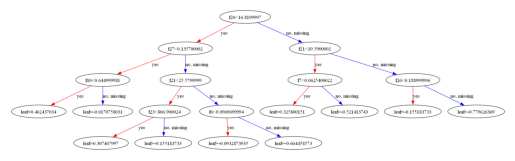

In [28]:
from xgboost import plot_tree
model = XGBClassifier(use_label_encoder=False, eval_metric='error')
model.fit(X, Y)
# plot single tree
plot_tree(model)
plt.show()

Plot the 4th tree

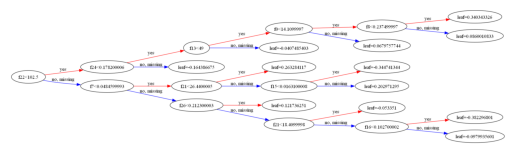

In [29]:
plot_tree(model, num_trees=3, rankdir='LR')
plt.show()

# Feature importance

In [30]:
print(model.feature_importances_)

[0.00211929 0.00929989 0.         0.01442304 0.00147751 0.00285351
 0.0064667  0.0965234  0.00052602 0.0026081  0.01096764 0.
 0.00561622 0.00465543 0.00474687 0.00351244 0.00814242 0.00816081
 0.0008615  0.00261759 0.509064   0.01425053 0.17871203 0.02324718
 0.00470599 0.00384743 0.01256012 0.06382718 0.00137262 0.00283462]


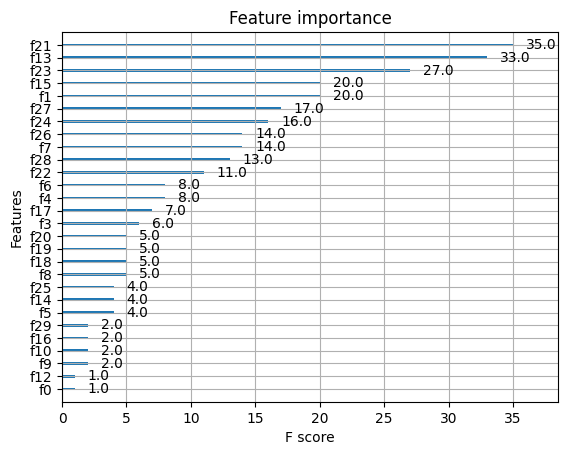

In [31]:
# plot
from xgboost import plot_importance
plot_importance(model)
plt.show()

skit-learn class SelectFromModel

In [32]:
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score
from numpy import sort

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=7)
# fit model on all training data
model = XGBClassifier(use_label_encoder=False,eval_metric='error')
model.fit(X_train, y_train)
# Fit model using each importance as a threshold
thresholds = sort(model.feature_importances_)
for thresh in thresholds:
  # select features using threshold
  selection = SelectFromModel(model, threshold=thresh, prefit=True)
  select_X_train = selection.transform(X_train)
  # train model
  selection_model = XGBClassifier(use_label_encoder=False,eval_metric='error')
  selection_model.fit(select_X_train, y_train)
  # eval model
  select_X_test = selection.transform(X_test)
  y_pred = selection_model.predict(select_X_test)
  predictions = [round(value) for value in y_pred]
  accuracy = accuracy_score(y_test, predictions)
  print("Thresh=%.5f, n=%d, Accuracy: %.2f%%" % (thresh, select_X_train.shape[1],accuracy*100.0))

Thresh=0.00000, n=30, Accuracy: 98.25%
Thresh=0.00000, n=30, Accuracy: 98.25%
Thresh=0.00000, n=30, Accuracy: 98.25%
Thresh=0.00098, n=27, Accuracy: 98.25%
Thresh=0.00176, n=26, Accuracy: 98.25%
Thresh=0.00194, n=25, Accuracy: 98.25%
Thresh=0.00225, n=24, Accuracy: 99.12%
Thresh=0.00231, n=23, Accuracy: 100.00%
Thresh=0.00268, n=22, Accuracy: 99.12%
Thresh=0.00376, n=21, Accuracy: 99.12%
Thresh=0.00445, n=20, Accuracy: 96.49%
Thresh=0.00523, n=19, Accuracy: 97.37%
Thresh=0.00568, n=18, Accuracy: 97.37%
Thresh=0.00585, n=17, Accuracy: 97.37%
Thresh=0.00683, n=16, Accuracy: 96.49%
Thresh=0.00693, n=15, Accuracy: 96.49%
Thresh=0.00895, n=14, Accuracy: 97.37%
Thresh=0.00918, n=13, Accuracy: 97.37%
Thresh=0.00919, n=12, Accuracy: 97.37%
Thresh=0.01119, n=11, Accuracy: 98.25%
Thresh=0.01578, n=10, Accuracy: 99.12%
Thresh=0.01593, n=9, Accuracy: 97.37%
Thresh=0.01697, n=8, Accuracy: 98.25%
Thresh=0.02242, n=7, Accuracy: 98.25%
Thresh=0.02756, n=6, Accuracy: 93.86%
Thresh=0.03471, n=5, Accurac

In [33]:
# select features using threshold
selection = SelectFromModel(model, threshold=0.00231, prefit=True)
select_X_train = selection.transform(X_train)
# train model
selection_model = XGBClassifier(use_label_encoder=False,eval_metric='error')
selection_model.fit(select_X_train, y_train)
# eval model
select_X_test = selection.transform(X_test)
y_pred = selection_model.predict(select_X_test)
predictions = [round(value) for value in y_pred]
accuracy = accuracy_score(y_test, predictions)
print(f'The accuracy is: {accuracy}')

matrix = confusion_matrix(Y_test, y_pred)
print(f'Confusion matrix:\n {matrix}')

precision= precision_score(Y_test, y_pred)
print('Precision score: {0:0.2f}'.format(precision))

recall = recall_score(Y_test, y_pred)
print('Recall score: {0:0.2f}'.format(recall))

f1 = f1_score(Y_test, y_pred)
print('F1 score: {0:0.2f}'.format(f1))


The accuracy is: 1.0
Confusion matrix:
 [[40  0]
 [ 0 74]]
Precision score: 1.00
Recall score: 1.00
F1 score: 1.00


Monitoring training perfomance

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=7)
eval_set = [(X_test, y_test)]
XGBClassifier(use_label_encoder=False, eval_metric='error')
model.fit(X_train, y_train, eval_set=eval_set, verbose=True)

[0]	validation_0-error:0.09649
[1]	validation_0-error:0.06140
[2]	validation_0-error:0.05263
[3]	validation_0-error:0.03509
[4]	validation_0-error:0.04386
[5]	validation_0-error:0.05263
[6]	validation_0-error:0.03509
[7]	validation_0-error:0.05263
[8]	validation_0-error:0.06140
[9]	validation_0-error:0.05263
[10]	validation_0-error:0.04386
[11]	validation_0-error:0.02632
[12]	validation_0-error:0.01754
[13]	validation_0-error:0.01754
[14]	validation_0-error:0.01754
[15]	validation_0-error:0.01754
[16]	validation_0-error:0.01754


[17]	validation_0-error:0.01754
[18]	validation_0-error:0.01754
[19]	validation_0-error:0.01754
[20]	validation_0-error:0.01754
[21]	validation_0-error:0.01754
[22]	validation_0-error:0.01754
[23]	validation_0-error:0.01754
[24]	validation_0-error:0.01754
[25]	validation_0-error:0.01754
[26]	validation_0-error:0.01754
[27]	validation_0-error:0.01754
[28]	validation_0-error:0.01754
[29]	validation_0-error:0.01754
[30]	validation_0-error:0.01754
[31]	validation_0-error:0.01754
[32]	validation_0-error:0.01754
[33]	validation_0-error:0.01754
[34]	validation_0-error:0.01754
[35]	validation_0-error:0.01754
[36]	validation_0-error:0.01754
[37]	validation_0-error:0.01754
[38]	validation_0-error:0.01754
[39]	validation_0-error:0.01754
[40]	validation_0-error:0.01754
[41]	validation_0-error:0.01754
[42]	validation_0-error:0.01754
[43]	validation_0-error:0.01754
[44]	validation_0-error:0.01754
[45]	validation_0-error:0.01754
[46]	validation_0-error:0.01754
[47]	validation_0-error:0.01754
[48]	val

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='error', feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

Learning curves

In [35]:
results = model.evals_result()
print(results)

{'validation_0': OrderedDict([('error', [0.09649122807017543, 0.06140350877192982, 0.05263157894736842, 0.03508771929824561, 0.04385964912280702, 0.05263157894736842, 0.03508771929824561, 0.05263157894736842, 0.06140350877192982, 0.05263157894736842, 0.04385964912280702, 0.02631578947368421, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.01754385964912281, 0.017543859649

C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\xgboost\sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


Accuracy: 98.25%


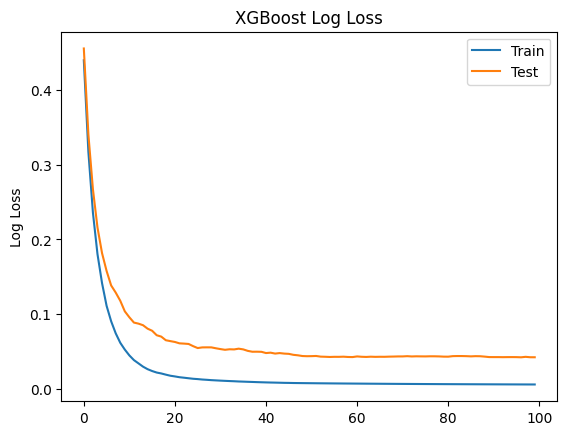

Text(0.5, 1.0, 'XGBoost Classification Error')

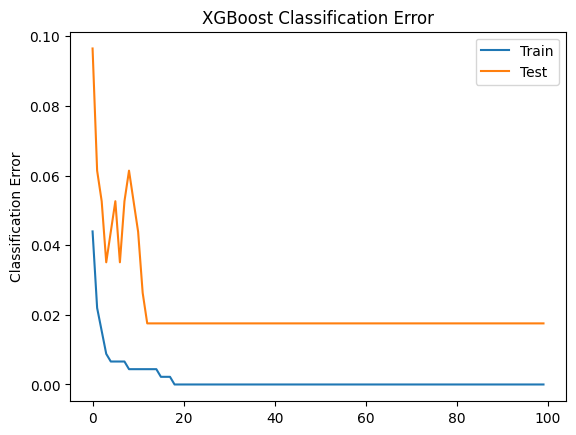

In [36]:
model = XGBClassifier(use_label_encoder=False)
eval_set = [(X_train, y_train), (X_test, y_test)]
model.fit(X_train, y_train, eval_metric=["error", "logloss"], eval_set=eval_set, verbose=False)
# make predictions for test data
y_pred = model.predict(X_test)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
# retrieve performance metrics
results = model.evals_result()
epochs = len(results['validation_0']['error'])
x_axis = range(0, epochs)
# plot log loss
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
ax.legend()
plt.ylabel('Log Loss')
plt.title('XGBoost Log Loss')
plt.show()
# plot classification error
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_0']['error'], label='Train')
ax.plot(x_axis, results['validation_1']['error'], label='Test')
ax.legend()
plt.ylabel('Classification Error')
plt.title('XGBoost Classification Error')

Early stopping

[0]	validation_0-logloss:0.44019	validation_1-logloss:0.45604
[1]	validation_0-logloss:0.31748	validation_1-logloss:0.34087
[2]	validation_0-logloss:0.23573	validation_1-logloss:0.26719
[3]	validation_0-logloss:0.18030	validation_1-logloss:0.21596
[4]	validation_0-logloss:0.14143	validation_1-logloss:0.18164
[5]	validation_0-logloss:0.11098	validation_1-logloss:0.15771
[6]	validation_0-logloss:0.09030	validation_1-logloss:0.13831
[7]	validation_0-logloss:0.07415	validation_1-logloss:0.12875
[8]	validation_0-logloss:0.06147	validation_1-logloss:0.11781
[9]	validation_0-logloss:0.05232	validation_1-logloss:0.10359
[10]	validation_0-logloss:0.04451	validation_1-logloss:0.09562
[11]	validation_0-logloss:0.03823	validation_1-logloss:0.08854
[12]	validation_0-logloss:0.03385	validation_1-logloss:0.08712
[13]	validation_0-logloss:0.02945	validation_1-logloss:0.08500
[14]	validation_0-logloss:0.02607	validation_1-logloss:0.08039
[15]	validation_0-logloss:0.02357	validation_1-logloss:0.07757
[1

C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\xgboost\sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\xgboost\sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-logloss:0.01634	validation_1-logloss:0.06254
[21]	validation_0-logloss:0.01528	validation_1-logloss:0.06070
[22]	validation_0-logloss:0.01462	validation_1-logloss:0.06035
[23]	validation_0-logloss:0.01390	validation_1-logloss:0.05988
[24]	validation_0-logloss:0.01321	validation_1-logloss:0.05693
[25]	validation_0-logloss:0.01277	validation_1-logloss:0.05439


[26]	validation_0-logloss:0.01220	validation_1-logloss:0.05525
[27]	validation_0-logloss:0.01181	validation_1-logloss:0.05533
[28]	validation_0-logloss:0.01136	validation_1-logloss:0.05530
[29]	validation_0-logloss:0.01103	validation_1-logloss:0.05409
[30]	validation_0-logloss:0.01071	validation_1-logloss:0.05299
[31]	validation_0-logloss:0.01042	validation_1-logloss:0.05205
[32]	validation_0-logloss:0.01014	validation_1-logloss:0.05274
[33]	validation_0-logloss:0.00989	validation_1-logloss:0.05255
[34]	validation_0-logloss:0.00957	validation_1-logloss:0.05356
[35]	validation_0-logloss:0.00937	validation_1-logloss:0.05259
[36]	validation_0-logloss:0.00914	validation_1-logloss:0.05061
[37]	validation_0-logloss:0.00893	validation_1-logloss:0.04945
[38]	validation_0-logloss:0.00871	validation_1-logloss:0.04950
[39]	validation_0-logloss:0.00851	validation_1-logloss:0.04934
[40]	validation_0-logloss:0.00833	validation_1-logloss:0.04768
[41]	validation_0-logloss:0.00817	validation_1-logloss

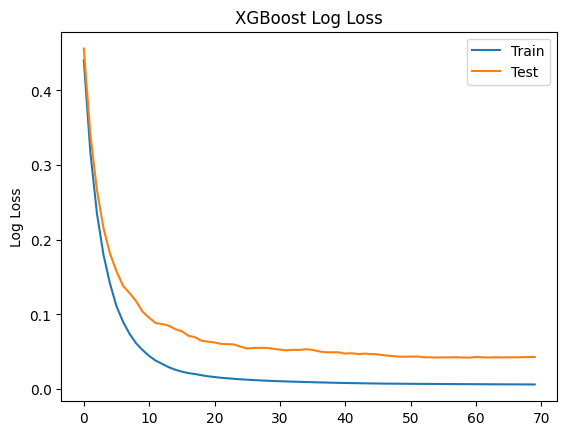

In [37]:
model = XGBClassifier(use_label_encoder=False)
eval_set = [(X_train, y_train), (X_test, y_test)]
model.fit(X_train, y_train, eval_metric=["logloss"], eval_set=eval_set, verbose=True, early_stopping_rounds=10)
# make predictions for test data
y_pred = model.predict(X_test)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
# retrieve performance metrics
results = model.evals_result()
epochs = len(results['validation_0']['logloss'])
x_axis = range(0, epochs)
# plot log loss
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
ax.legend()
plt.ylabel('Log Loss')
plt.title('XGBoost Log Loss')
plt.show()
